## Соревнование по классификации

### Результат: Метрика F1 > 0.9

Описание датасета

- assessments.csv - Файл содержит информацию об оценках в модулях-презентациях. Обычно каждая презентация имеет ряд оценок, за которыми следует итоговый экзамен.

- courses.csv - Файл содержит список всех доступных модулей и их презентаций.

- studentInfo.csv - Файл содержит демографическую информацию об учащихся.

- studentRegistration.csv - Файл содержит информацию о времени регистрации студента на презентацию модуля.

- studentVle.csv - Фйал содержит информацию о взаимодействии каждого учащегося с материалами в VLE.

- vle.csv - Файл содержит информацию о доступных материалах в VLE (Virtual Learning Environment). Обычно это html-страницы, pdf-файлы и т. д.

Студенты имеют доступ к этим материалам в Интернете, и их взаимодействие с материалами записывается.

- Test_Who.csv - перечень id_student, code_modelu и code_presentation для тестовой выборки. ID - внутренний идентификатор для оценки на Kaggle

- Train_Who.csv - перечень id_student, code_modelu и code_presentation для тренировочной выборки. ID - внутренний идентификатор для оценки на Kaggle

- Train_Target_clf.csv - целевая метрика для тренировочной выборки. ID - внутренний идентификатор для оценки на Kaggle, как в файле Train_Who.csv

- Submission_clf.csv - Пример файла для загрузки, в который проставлен всем незачет(кто знает может использовать для подгонки 👀). ID - внутренний идентификатор для оценки на Kaggle, как в файле Test_Who.csv

### Import библиотек

In [120]:
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import classification_report
from sklearn.model_selection import StratifiedKFold

from sklearn.metrics import confusion_matrix

from sklearn.metrics import accuracy_score as acc
from sklearn.metrics import f1_score as f1

In [121]:
# 1. Основные библиотеки
import numpy as np
import pandas as pd
import pickle   # сохранение модели

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import xgboost as xgb

from sklearn.model_selection import train_test_split, KFold, GridSearchCV

from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import mean_squared_error as mse, r2_score as r2
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score
from catboost import CatBoostClassifier, cv, Pool
from sklearn.ensemble import RandomForestClassifier
# 5. Для визуализации внешних картинок в ноутбуке
from IPython.display import Image

from sklearn.preprocessing import LabelEncoder

### Скачиваем данные

In [122]:
# данные которые "все"
ass = pd.read_csv('assessments.csv')
courses = pd.read_csv('courses.csv')
# results = pd.read_csv('studentAssessment.csv')
info = pd.read_csv('studentInfo.csv')
reg = pd.read_csv('studentRegistration.csv')
studentVle = pd.read_csv('studentVle.csv')
vle = pd.read_csv('vle.csv')

In [123]:
Train_Who = pd.read_csv('Train_Who.csv')
Test_Who = pd.read_csv('Test_Who.csv')

#### Assessments info (информация об оценках)
- code_module – идентификационный код модуля, которому принадлежит оценка.
- code_presentation - идентификационный код презентации, к которой относится оценка.
- id_assessment – идентификационный номер оценки.
- assessment_type – вид оценки. Существует три типа оценок: оцениваемая репетитором (TMA), компьютерная оцениваемая оценка (CMA) и итоговый экзамен (Exam).
- date – информация об окончательной дате сдачи оценки, рассчитанная как количество дней с момента начала модуля-презентации. Дата начала презентации имеет номер 0 (ноль).
- weight - вес оценки в %. Обычно Экзамены обрабатываются отдельно и имеют вес 100%; сумма всех остальных оценок равна 100%.

In [124]:
ass.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206 entries, 0 to 205
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   code_module        206 non-null    object 
 1   code_presentation  206 non-null    object 
 2   id_assessment      206 non-null    int64  
 3   assessment_type    206 non-null    object 
 4   date               195 non-null    float64
 5   weight             206 non-null    float64
dtypes: float64(2), int64(1), object(3)
memory usage: 9.8+ KB


Првоерим данные на пропуски

In [125]:
ass.isnull().sum()

code_module           0
code_presentation     0
id_assessment         0
assessment_type       0
date                 11
weight                0
dtype: int64

In [126]:
ass.head()

,code_module,code_presentation,id_assessment,assessment_type,date,weight
0,AAA,2013J,1752,TMA,19.0,10.0
1,AAA,2013J,1753,TMA,54.0,20.0
2,AAA,2013J,1754,TMA,117.0,20.0
3,AAA,2013J,1755,TMA,166.0,20.0
4,AAA,2013J,1756,TMA,215.0,30.0


In [127]:
ass = ass.fillna(0)

#### Courses info (информация о курсах)
- code_module – кодовое имя модуля, которое служит идентификатором.
- code_presentation – кодовое название презентации. Он состоит из года и «B» для презентации, начинающейся в феврале, и «J» для презентации, начинающейся в октябре.
- module_presentation_length - длина модуля-презентации в днях.

In [128]:
courses.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22 entries, 0 to 21
Data columns (total 3 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   code_module                 22 non-null     object
 1   code_presentation           22 non-null     object
 2   module_presentation_length  22 non-null     int64 
dtypes: int64(1), object(2)
memory usage: 656.0+ bytes


In [129]:
courses.head()

,code_module,code_presentation,module_presentation_length
0,AAA,2013J,268
1,AAA,2014J,269
2,BBB,2013J,268
3,BBB,2014J,262
4,BBB,2013B,240


In [130]:
courses.isnull().sum()

code_module                   0
code_presentation             0
module_presentation_length    0
dtype: int64

#### Student registration (регистрация студентов)
- code_module – идентификационный код модуля.
- code_presentation - идентификационный код презентации.
- id_student – уникальный идентификационный номер студента.
- date_registration – дата регистрации студента на презентацию модуля, это количество дней, измеренное относительно начала презентации модуля (например, отрицательное значение -30 означает, что студент зарегистрировался на презентацию модуля за 30 дней до ее начала).

In [131]:
reg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32593 entries, 0 to 32592
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   code_module        32593 non-null  object 
 1   code_presentation  32593 non-null  object 
 2   id_student         32593 non-null  int64  
 3   date_registration  32548 non-null  float64
dtypes: float64(1), int64(1), object(2)
memory usage: 1018.7+ KB


In [132]:
reg.head()

,code_module,code_presentation,id_student,date_registration
0,AAA,2013J,11391,-159.0
1,AAA,2013J,28400,-53.0
2,AAA,2013J,30268,-92.0
3,AAA,2013J,31604,-52.0
4,AAA,2013J,32885,-176.0


In [133]:
reg.isnull().sum()

code_module           0
code_presentation     0
id_student            0
date_registration    45
dtype: int64

In [134]:
reg=reg.fillna(0)

#### VLE resources
- id_site - идентификационный номер материала.
- code_module – идентификационный код модуля.
- code_presentation - идентификационный код презентации.
- activity_type – роль, связанная с материалом модуля.
- week_from – неделя, с которой планируется использовать материал.
- week_to – неделя, до которой планируется использовать материал.

In [135]:
vle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6364 entries, 0 to 6363
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id_site            6364 non-null   int64  
 1   code_module        6364 non-null   object 
 2   code_presentation  6364 non-null   object 
 3   activity_type      6364 non-null   object 
 4   week_from          1121 non-null   float64
 5   week_to            1121 non-null   float64
dtypes: float64(2), int64(1), object(3)
memory usage: 298.4+ KB


In [136]:
vle.head()

,id_site,code_module,code_presentation,activity_type,week_from,week_to
0,546943,AAA,2013J,resource,NaN,NaN
1,546712,AAA,2013J,oucontent,NaN,NaN
2,546998,AAA,2013J,resource,NaN,NaN
3,546888,AAA,2013J,url,NaN,NaN
4,547035,AAA,2013J,resource,NaN,NaN


In [137]:
vle.isnull().sum()

id_site                 0
code_module             0
code_presentation       0
activity_type           0
week_from            5243
week_to              5243
dtype: int64

In [138]:
vle = vle.fillna(0)

#### VLE Interactions
- code_module – идентификационный код модуля.
- code_presentation - идентификационный код представления модуля.
- id_student – уникальный идентификационный номер студента.
- id_site - идентификационный номер материала VLE.
- date – дата взаимодействия студента с материалом измеряется как количество дней с начала модуля-презентации.
- sum_click – сколько раз учащийся взаимодействовал с материалом в этот день.

In [139]:
studentVle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10655280 entries, 0 to 10655279
Data columns (total 6 columns):
 #   Column             Dtype 
---  ------             ----- 
 0   code_module        object
 1   code_presentation  object
 2   id_student         int64 
 3   id_site            int64 
 4   date               int64 
 5   sum_click          int64 
dtypes: int64(4), object(2)
memory usage: 487.8+ MB


In [140]:
studentVle.head()

,code_module,code_presentation,id_student,id_site,date,sum_click
0,AAA,2013J,28400,546652,-10,4
1,AAA,2013J,28400,546652,-10,1
2,AAA,2013J,28400,546652,-10,1
3,AAA,2013J,28400,546614,-10,11
4,AAA,2013J,28400,546714,-10,1


In [141]:
studentVle.isnull().sum()

code_module          0
code_presentation    0
id_student           0
id_site              0
date                 0
sum_click            0
dtype: int64

#### Student information
- code_module – идентификационный код модуля, на котором зарегистрирован студент.
- code_presentation - идентификационный код презентации, во время которой студент регистрируется на модуле.
- id_student – уникальный идентификационный номер студента.
- gender – пол ученика.
- region – определяет географический регион, в котором студент проживал во время прохождения модуля-презентации.
- highest_education – самый высокий уровень образования студента при поступлении на модульную презентацию.
- imd_band – задает диапазон Index of Multiple Depravation места, где студент проживал во время модуля-презентации. (насколько бедный район, короче)
- age_band – диапазон студенческого возраста.
- num_of_prev_attempts – количество раз, когда учащийся пытался пройти этот модуль.
- studied_credits – общее количество кредитов по модулям, которые студент изучает в настоящее время.
- disability – указывает, признан ли студент инвалидом.

In [142]:
info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32593 entries, 0 to 32592
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   code_module           32593 non-null  object
 1   code_presentation     32593 non-null  object
 2   id_student            32593 non-null  int64 
 3   gender                32593 non-null  object
 4   region                32593 non-null  object
 5   highest_education     32593 non-null  object
 6   imd_band              31482 non-null  object
 7   age_band              32593 non-null  object
 8   num_of_prev_attempts  32593 non-null  int64 
 9   studied_credits       32593 non-null  int64 
 10  disability            32593 non-null  object
dtypes: int64(3), object(8)
memory usage: 2.7+ MB


In [143]:
info.head()


,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability
0,AAA,2013J,11391,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,N
1,AAA,2013J,28400,F,Scotland,HE Qualification,20-30%,35-55,0,60,N
2,AAA,2013J,30268,F,North Western Region,A Level or Equivalent,30-40%,35-55,0,60,Y
3,AAA,2013J,31604,F,South East Region,A Level or Equivalent,50-60%,35-55,0,60,N
4,AAA,2013J,32885,F,West Midlands Region,Lower Than A Level,50-60%,0-35,0,60,N


In [144]:
info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32593 entries, 0 to 32592
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   code_module           32593 non-null  object
 1   code_presentation     32593 non-null  object
 2   id_student            32593 non-null  int64 
 3   gender                32593 non-null  object
 4   region                32593 non-null  object
 5   highest_education     32593 non-null  object
 6   imd_band              31482 non-null  object
 7   age_band              32593 non-null  object
 8   num_of_prev_attempts  32593 non-null  int64 
 9   studied_credits       32593 non-null  int64 
 10  disability            32593 non-null  object
dtypes: int64(3), object(8)
memory usage: 2.7+ MB


In [145]:
info.isnull().sum()

code_module                0
code_presentation          0
id_student                 0
gender                     0
region                     0
highest_education          0
imd_band                1111
age_band                   0
num_of_prev_attempts       0
studied_credits            0
disability                 0
dtype: int64

In [146]:
info = info.fillna(0)

### Создадим из набора таблиц объединенный датасет

In [147]:
info

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability
0,AAA,2013J,11391,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,N
1,AAA,2013J,28400,F,Scotland,HE Qualification,20-30%,35-55,0,60,N
2,AAA,2013J,30268,F,North Western Region,A Level or Equivalent,30-40%,35-55,0,60,Y
3,AAA,2013J,31604,F,South East Region,A Level or Equivalent,50-60%,35-55,0,60,N
4,AAA,2013J,32885,F,West Midlands Region,Lower Than A Level,50-60%,0-35,0,60,N
...,...,...,...,...,...,...,...,...,...,...,...
32588,GGG,2014J,2640965,F,Wales,Lower Than A Level,10-20,0-35,0,30,N
32589,GGG,2014J,2645731,F,East Anglian Region,Lower Than A Level,40-50%,35-55,0,30,N
32590,GGG,2014J,2648187,F,South Region,A Level or Equivalent,20-30%,0-35,0,30,Y
32591,GGG,2014J,2679821,F,South East Region,Lower Than A Level,90-100%,35-55,0,30,N


In [148]:
courses

,code_module,code_presentation,module_presentation_length
0,AAA,2013J,268
1,AAA,2014J,269
2,BBB,2013J,268
3,BBB,2014J,262
4,BBB,2013B,240
5,BBB,2014B,234
6,CCC,2014J,269
7,CCC,2014B,241
8,DDD,2013J,261
9,DDD,2014J,262


#### Объединим info и courses ( информация о студенте и о курсах)

In [149]:
df1 = pd.merge(info, courses, on=['code_module', 'code_presentation'], how='inner')
df1

,code_module,code_presentation,id_student,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,module_presentation_length
0,AAA,2013J,11391,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,N,268
1,AAA,2013J,28400,F,Scotland,HE Qualification,20-30%,35-55,0,60,N,268
2,AAA,2013J,30268,F,North Western Region,A Level or Equivalent,30-40%,35-55,0,60,Y,268
3,AAA,2013J,31604,F,South East Region,A Level or Equivalent,50-60%,35-55,0,60,N,268
4,AAA,2013J,32885,F,West Midlands Region,Lower Than A Level,50-60%,0-35,0,60,N,268
...,...,...,...,...,...,...,...,...,...,...,...,...
32588,GGG,2014J,2640965,F,Wales,Lower Than A Level,10-20,0-35,0,30,N,269
32589,GGG,2014J,2645731,F,East Anglian Region,Lower Than A Level,40-50%,35-55,0,30,N,269
32590,GGG,2014J,2648187,F,South Region,A Level or Equivalent,20-30%,0-35,0,30,Y,269
32591,GGG,2014J,2679821,F,South East Region,Lower Than A Level,90-100%,35-55,0,30,N,269


#### Добавим информацию о дате регистрации студента на курс

In [150]:
df2 = pd.merge(reg, df1, on=['code_module', 'code_presentation', 'id_student'], how='inner')
df2

,code_module,code_presentation,id_student,date_registration,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,module_presentation_length
0,AAA,2013J,11391,-159.0,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,N,268
1,AAA,2013J,28400,-53.0,F,Scotland,HE Qualification,20-30%,35-55,0,60,N,268
2,AAA,2013J,30268,-92.0,F,North Western Region,A Level or Equivalent,30-40%,35-55,0,60,Y,268
3,AAA,2013J,31604,-52.0,F,South East Region,A Level or Equivalent,50-60%,35-55,0,60,N,268
4,AAA,2013J,32885,-176.0,F,West Midlands Region,Lower Than A Level,50-60%,0-35,0,60,N,268
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32588,GGG,2014J,2640965,-4.0,F,Wales,Lower Than A Level,10-20,0-35,0,30,N,269
32589,GGG,2014J,2645731,-23.0,F,East Anglian Region,Lower Than A Level,40-50%,35-55,0,30,N,269
32590,GGG,2014J,2648187,-129.0,F,South Region,A Level or Equivalent,20-30%,0-35,0,30,Y,269
32591,GGG,2014J,2679821,-49.0,F,South East Region,Lower Than A Level,90-100%,35-55,0,30,N,269


#### Добавим информацию об оценках в модулях-презентациях (суммарная оценка по модулям)

Вес оценки по каждому курсу может иметь сильное влияние на конечный балл студента! Скорее всего это т признак может внести большой вклад в объяснение таргета

In [151]:
a = ass.groupby(['code_module','code_presentation']).agg(total_weight = ('weight',sum)).reset_index()
a.head()

,code_module,code_presentation,total_weight
0,AAA,2013J,200.0
1,AAA,2014J,200.0
2,BBB,2013B,200.0
3,BBB,2013J,200.0
4,BBB,2014B,200.0


In [152]:
df3 = pd.merge(a, df2, on=['code_module', 'code_presentation'], how='inner')
df3

,code_module,code_presentation,total_weight,id_student,date_registration,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,module_presentation_length
0,AAA,2013J,200.0,11391,-159.0,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,N,268
1,AAA,2013J,200.0,28400,-53.0,F,Scotland,HE Qualification,20-30%,35-55,0,60,N,268
2,AAA,2013J,200.0,30268,-92.0,F,North Western Region,A Level or Equivalent,30-40%,35-55,0,60,Y,268
3,AAA,2013J,200.0,31604,-52.0,F,South East Region,A Level or Equivalent,50-60%,35-55,0,60,N,268
4,AAA,2013J,200.0,32885,-176.0,F,West Midlands Region,Lower Than A Level,50-60%,0-35,0,60,N,268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32588,GGG,2014J,100.0,2640965,-4.0,F,Wales,Lower Than A Level,10-20,0-35,0,30,N,269
32589,GGG,2014J,100.0,2645731,-23.0,F,East Anglian Region,Lower Than A Level,40-50%,35-55,0,30,N,269
32590,GGG,2014J,100.0,2648187,-129.0,F,South Region,A Level or Equivalent,20-30%,0-35,0,30,Y,269
32591,GGG,2014J,100.0,2679821,-49.0,F,South East Region,Lower Than A Level,90-100%,35-55,0,30,N,269


#### Добавим информацию о студентах по различным курсам

In [153]:
df_vle = studentVle.merge(vle, how='inner', on=['code_module', 'code_presentation', 'id_site'])
df_vle.head()

,code_module,code_presentation,id_student,id_site,date,sum_click,activity_type,week_from,week_to
0,AAA,2013J,28400,546652,-10,4,forumng,0.0,0.0
1,AAA,2013J,28400,546652,-10,1,forumng,0.0,0.0
2,AAA,2013J,28400,546652,-10,1,forumng,0.0,0.0
3,AAA,2013J,28400,546652,-10,8,forumng,0.0,0.0
4,AAA,2013J,30268,546652,-10,3,forumng,0.0,0.0


In [154]:
df_vle=df_vle.fillna(0)

In [155]:
df_vle.head()

,code_module,code_presentation,id_student,id_site,date,sum_click,activity_type,week_from,week_to
0,AAA,2013J,28400,546652,-10,4,forumng,0.0,0.0
1,AAA,2013J,28400,546652,-10,1,forumng,0.0,0.0
2,AAA,2013J,28400,546652,-10,1,forumng,0.0,0.0
3,AAA,2013J,28400,546652,-10,8,forumng,0.0,0.0
4,AAA,2013J,30268,546652,-10,3,forumng,0.0,0.0


#### Добавим информацию о длительности курсов и активности студентов по каждому курсу

Введем два признака:
- первый - среднее время взаимодействия студента с курсом 
- второй - сумма кликов по курсу ( активность студента)


Кажется, что эти признаки также могут внести вклад в объяснение таргета

In [156]:
b = df_vle.groupby(['code_module','code_presentation', 'id_student'])\
.agg(mean_date = ('date',np.mean), sum_click = ('sum_click',sum)).reset_index()

In [157]:
b = b.fillna(0)
b.head()

,code_module,code_presentation,id_student,mean_date,sum_click
0,AAA,2013J,11391,102.132653,934
1,AAA,2013J,28400,86.993023,1435
2,AAA,2013J,30268,2.355263,281
3,AAA,2013J,31604,106.147813,2158
4,AAA,2013J,32885,91.934659,1034


In [158]:
df3

,code_module,code_presentation,total_weight,id_student,date_registration,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,module_presentation_length
0,AAA,2013J,200.0,11391,-159.0,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,N,268
1,AAA,2013J,200.0,28400,-53.0,F,Scotland,HE Qualification,20-30%,35-55,0,60,N,268
2,AAA,2013J,200.0,30268,-92.0,F,North Western Region,A Level or Equivalent,30-40%,35-55,0,60,Y,268
3,AAA,2013J,200.0,31604,-52.0,F,South East Region,A Level or Equivalent,50-60%,35-55,0,60,N,268
4,AAA,2013J,200.0,32885,-176.0,F,West Midlands Region,Lower Than A Level,50-60%,0-35,0,60,N,268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32588,GGG,2014J,100.0,2640965,-4.0,F,Wales,Lower Than A Level,10-20,0-35,0,30,N,269
32589,GGG,2014J,100.0,2645731,-23.0,F,East Anglian Region,Lower Than A Level,40-50%,35-55,0,30,N,269
32590,GGG,2014J,100.0,2648187,-129.0,F,South Region,A Level or Equivalent,20-30%,0-35,0,30,Y,269
32591,GGG,2014J,100.0,2679821,-49.0,F,South East Region,Lower Than A Level,90-100%,35-55,0,30,N,269


In [159]:
df4 = pd.merge(b,df3, how='inner', on=['code_module', 'code_presentation', 'id_student'])
df4.head()

,code_module,code_presentation,id_student,mean_date,sum_click,total_weight,date_registration,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,module_presentation_length
0,AAA,2013J,11391,102.132653,934,200.0,-159.0,M,East Anglian Region,HE Qualification,90-100%,55<=,0,240,N,268
1,AAA,2013J,28400,86.993023,1435,200.0,-53.0,F,Scotland,HE Qualification,20-30%,35-55,0,60,N,268
2,AAA,2013J,30268,2.355263,281,200.0,-92.0,F,North Western Region,A Level or Equivalent,30-40%,35-55,0,60,Y,268
3,AAA,2013J,31604,106.147813,2158,200.0,-52.0,F,South East Region,A Level or Equivalent,50-60%,35-55,0,60,N,268
4,AAA,2013J,32885,91.934659,1034,200.0,-176.0,F,West Midlands Region,Lower Than A Level,50-60%,0-35,0,60,N,268


#### Объединим созданные датасеты с Train и Test

In [160]:
Train = pd.merge(Train_Who, df4, on=['id_student', 'code_module', 'code_presentation'], how='left')
# Прячем "наш" ID в index фрейма
Train.index = Train.ID
# удаляем как столбец, ибо зачем
Train.drop(columns = ['ID'], inplace = True)
Train

,id_student,code_module,code_presentation,mean_date,sum_click,total_weight,date_registration,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,module_presentation_length
ID,,,,,,,,,,,,,,,,
0,464685,DDD,2014B,110.194958,1694.0,200.0,-36.0,F,East Anglian Region,A Level or Equivalent,50-60%,0-35,1.0,70.0,N,241.0
1,606593,DDD,2013J,29.574924,692.0,200.0,-32.0,M,Scotland,A Level or Equivalent,20-30%,0-35,0.0,120.0,N,261.0
2,1674799,CCC,2014J,106.163807,1963.0,300.0,-21.0,M,South Region,HE Qualification,70-80%,55<=,0.0,60.0,N,269.0
3,195246,FFF,2014J,70.568846,2138.0,200.0,-124.0,M,West Midlands Region,Lower Than A Level,10-20,0-35,0.0,60.0,N,269.0
4,582080,FFF,2013J,-4.682927,188.0,200.0,-114.0,M,South East Region,Lower Than A Level,10-20,35-55,0.0,60.0,N,268.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26069,588477,AAA,2014J,79.212887,5183.0,200.0,-141.0,M,Yorkshire Region,HE Qualification,20-30%,0-35,0.0,60.0,N,269.0
26070,653826,BBB,2014J,-8.000000,42.0,200.0,-64.0,F,North Western Region,HE Qualification,30-40%,35-55,0.0,120.0,N,262.0
26071,126411,BBB,2013B,29.857143,25.0,200.0,-124.0,F,West Midlands Region,Lower Than A Level,0-10%,0-35,2.0,60.0,Y,240.0


In [161]:
num=Train.isna().sum()
num

id_student                       0
code_module                      0
code_presentation                0
mean_date                     2710
sum_click                     2710
total_weight                  2710
date_registration             2710
gender                        2710
region                        2710
highest_education             2710
imd_band                      2710
age_band                      2710
num_of_prev_attempts          2710
studied_credits               2710
disability                    2710
module_presentation_length    2710
dtype: int64

Заполним пропущенные значения 0

In [162]:
for i in range(len(num)):
    if num[i] != 0:
        Train[Train.columns[i]] = Train[Train.columns[i]].fillna(0)

In [163]:
Train.isna().sum()

id_student                    0
code_module                   0
code_presentation             0
mean_date                     0
sum_click                     0
total_weight                  0
date_registration             0
gender                        0
region                        0
highest_education             0
imd_band                      0
age_band                      0
num_of_prev_attempts          0
studied_credits               0
disability                    0
module_presentation_length    0
dtype: int64

Индекс тренировочного датасета - для отделения в будущем его от тестовых данных

In [164]:
train_ind=Train.shape[0]

In [165]:
Test = pd.merge(Test_Who, df4, on=['id_student', 'code_module', 'code_presentation'], how='left')
# Прячем "наш" ID в index фрейма
Test.index = Test.ID
# удаляем как столбец, ибо зачем
Test.drop(columns = ['ID'], inplace = True)
Test.head()

,id_student,code_module,code_presentation,mean_date,sum_click,total_weight,date_registration,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,module_presentation_length
ID,,,,,,,,,,,,,,,,
26074,2588655,DDD,2014J,139.425532,297.0,200.0,-92.0,M,Scotland,Lower Than A Level,50-60%,0-35,2.0,60.0,N,262.0
26075,543628,CCC,2014B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26076,387276,BBB,2013B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26077,692219,CCC,2014J,8.622222,283.0,300.0,-34.0,M,South Region,A Level or Equivalent,20-30%,0-35,0.0,90.0,N,269.0
26078,516212,BBB,2013J,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [166]:
num = Test.isna().sum()
num

id_student                      0
code_module                     0
code_presentation               0
mean_date                     655
sum_click                     655
total_weight                  655
date_registration             655
gender                        655
region                        655
highest_education             655
imd_band                      655
age_band                      655
num_of_prev_attempts          655
studied_credits               655
disability                    655
module_presentation_length    655
dtype: int64

Заполним пропущенные значения 0

In [167]:
for i in range(len(num)):
    if num[i] != 0:
        Test[Test.columns[i]] = Test[Test.columns[i]].fillna(0)

In [168]:
Target = pd.read_csv('Train_Target_clf.csv', index_col = 'ID')
Submission = pd.read_csv('Submission_clf.csv', index_col = 'ID')

#### Объединим тестовый и тренировочный датасеты для дальнейшей работы с ними

In [169]:
df = pd.concat([Train, Test])

In [170]:
df = df.merge(Target,on=['ID'], how='left')

In [171]:
df[:train_ind]

,id_student,code_module,code_presentation,mean_date,sum_click,total_weight,date_registration,gender,region,highest_education,imd_band,age_band,num_of_prev_attempts,studied_credits,disability,module_presentation_length,final_result
ID,,,,,,,,,,,,,,,,,
0,464685,DDD,2014B,110.194958,1694.0,200.0,-36.0,F,East Anglian Region,A Level or Equivalent,50-60%,0-35,1.0,70.0,N,241.0,1.0
1,606593,DDD,2013J,29.574924,692.0,200.0,-32.0,M,Scotland,A Level or Equivalent,20-30%,0-35,0.0,120.0,N,261.0,0.0
2,1674799,CCC,2014J,106.163807,1963.0,300.0,-21.0,M,South Region,HE Qualification,70-80%,55<=,0.0,60.0,N,269.0,1.0
3,195246,FFF,2014J,70.568846,2138.0,200.0,-124.0,M,West Midlands Region,Lower Than A Level,10-20,0-35,0.0,60.0,N,269.0,0.0
4,582080,FFF,2013J,-4.682927,188.0,200.0,-114.0,M,South East Region,Lower Than A Level,10-20,35-55,0.0,60.0,N,268.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26069,588477,AAA,2014J,79.212887,5183.0,200.0,-141.0,M,Yorkshire Region,HE Qualification,20-30%,0-35,0.0,60.0,N,269.0,1.0
26070,653826,BBB,2014J,-8.000000,42.0,200.0,-64.0,F,North Western Region,HE Qualification,30-40%,35-55,0.0,120.0,N,262.0,0.0
26071,126411,BBB,2013B,29.857143,25.0,200.0,-124.0,F,West Midlands Region,Lower Than A Level,0-10%,0-35,2.0,60.0,Y,240.0,0.0


#### Выведим числовые и категориальные признаки

In [172]:
num_columns=[]
cat_columns =[]
for i in df.columns:
    if df[i].dtype == np.float64 or df[i].dtype == np.int64 or df[i].dtype == np.int32:
        num_columns.append(i)
    else:
        cat_columns.append(i)

In [173]:
num_columns

['id_student',
 'mean_date',
 'sum_click',
 'total_weight',
 'date_registration',
 'num_of_prev_attempts',
 'studied_credits',
 'module_presentation_length',
 'final_result']

In [174]:
cat_columns

['code_module',
 'code_presentation',
 'gender',
 'region',
 'highest_education',
 'imd_band',
 'age_band',
 'disability']

### Проведем Exploratory Data Analysis

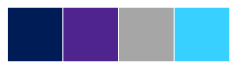

In [175]:
colors = ['#001c57','#50248f','#a6a6a6','#38d1ff']
sns.palplot(sns.color_palette(colors))

In [176]:
df.final_result.value_counts()

0.0    13761
1.0    12313
Name: final_result, dtype: int64

Классы тагрета - сбалансированны

Рассмотрим матрицу корреляции числовых признаков

In [177]:
df_num =df[num_columns]

<Axes: >

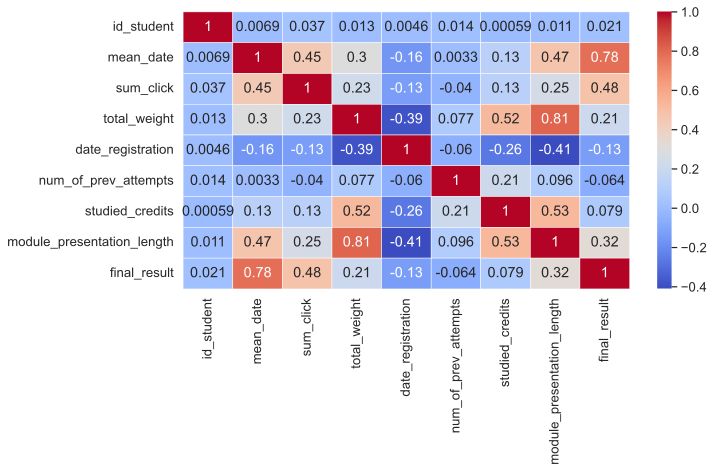

In [178]:
plt.figure(figsize=(10, 5))
sns.set(font_scale=1.2)
corr_matrix = df_num.corr()
sns.heatmap(corr_matrix, annot=True, linewidths=.5, cmap='coolwarm')

Видно, что признаки имеют сильную корреляцию с таргетом: mean_date, sum_click, total_weight, module_presentation_lengh - причем эти признаки были нами созданы!

Также некоторые признки сильно коррелируют друг с другом, например, sum_click - mean_date - что логично, тк активность студента зависит от времени проведенным за выполнением курса, mean_date - module_presentation_lengh - аналогично длина всего курса, зависит от общего времени, который студент потратил на этот курс

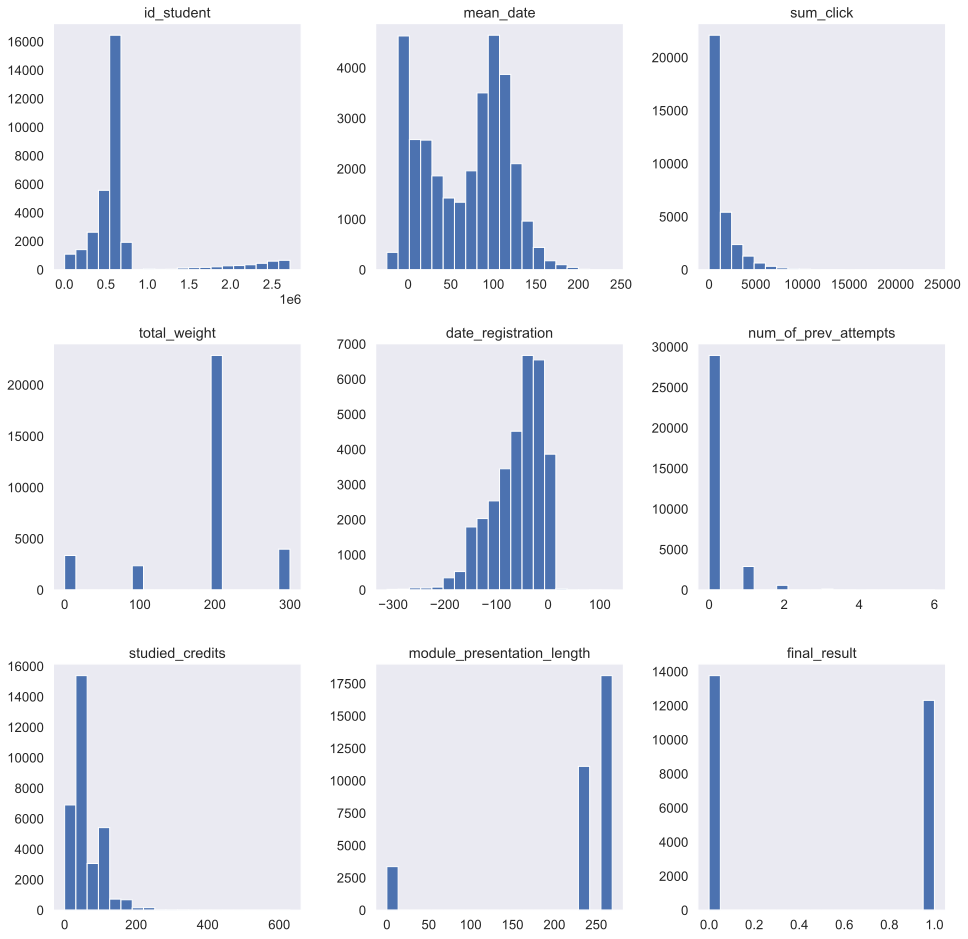

In [179]:
df_num.hist(figsize=(16, 16), bins=20, grid=False);

id_student - нужно удалить, так как он не несет никакой информации

#### Исследуем признаки 

Признак mean_date имеет два пика- первый приходится на студентов, которые практически не посищают курсы, второй- на тех кто их посещает

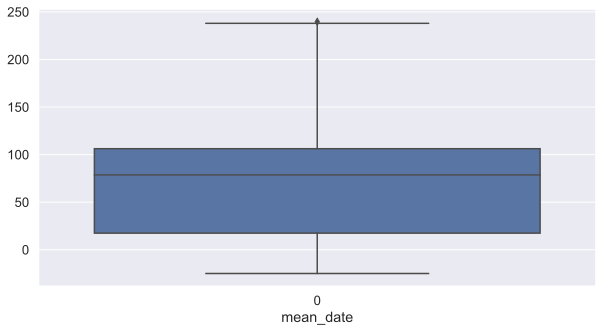

In [180]:
plt.figure(figsize=(10, 5))

sns.boxplot(df['mean_date'], whis=1.5)

plt.xlabel('mean_date')
plt.show()

Видно, что выбросов нет

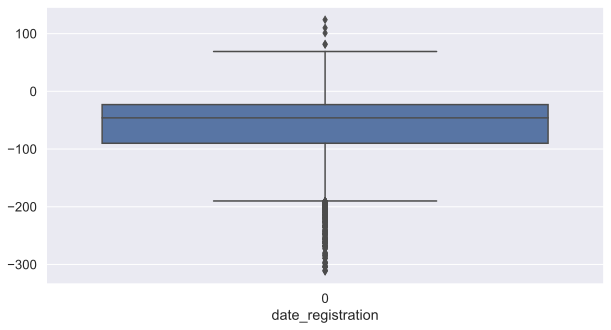

In [181]:
plt.figure(figsize=(10, 5))

sns.boxplot(df['date_registration'], whis=1.5)

plt.xlabel('date_registration')
plt.show()

Скорее всего значения выходящие за пределы интервала связаны с тем, что студенты могут регистрироваться на курс позже срока, или раньше срока, пока не будем удалять эти данные

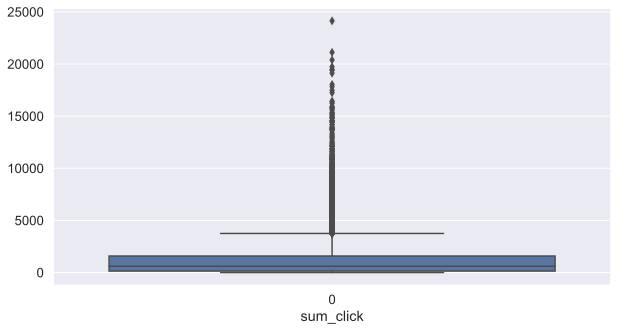

In [182]:
plt.figure(figsize=(10, 5))

sns.boxplot(df['sum_click'], whis=1.5)

plt.xlabel('sum_click')
plt.show()

Также эти значения вряд ли являются выбросами тк студент может делать сколько угодно кликов по страничке

#### Посмотрим на связь признаков друг с другом

In [183]:
grid = sns.jointplot(x = df["mean_date"], y = df["sum_click"], data=df, kind='reg')
grid.fig.set_figwidth(5)
grid.fig.set_figheight(5)
plt.show()

In [184]:
grid = sns.jointplot(x = df["total_weight"], y = df["studied_credits"], data=df, kind='reg')
grid.fig.set_figwidth(5)
grid.fig.set_figheight(5)
plt.show()

#### Оставим только информативные признаки (по нашему мнению)

In [54]:
num_columns=['mean_date',
 'sum_click',
 'total_weight',
 'date_registration',
 'num_of_prev_attempts',
 'studied_credits',
 'module_presentation_length']

И также пока оставим все категориальные признаки и посмотрим на качество работы алгоритма

In [52]:
cat_columns= ['gender',
 'region',
 'highest_education',
 'imd_band',
 'age_band',
 'disability']

#### Используем CatBoost, поэтому обрабатывать категориальные признаки - не нужно

In [88]:
col = cat_columns + num_columns

In [89]:
df = df[col]

#### Разделим данные

In [92]:
from sklearn.model_selection import train_test_split

In [93]:
X = df.iloc[0:train_ind,:][col]
y = Target['final_result']

In [94]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.2, random_state = 42)

In [60]:
pip install CatBoost

Note: you may need to restart the kernel to use updated packages.


In [61]:
from catboost import CatBoostClassifier

In [90]:
from catboost import Pool

Приведем данные в нужный для CatBoost вид

In [100]:
train_data = Pool(
    data=X_train,
    label = y_train,
    cat_features= cat_columns,
    feature_names = col
)

eval_data = Pool(
    data=X_test,
    label = y_test,
    cat_features= cat_columns,
    feature_names = col
)

Обучим модель, для начала на 1000 итерациях

In [63]:
model = CatBoostClassifier(loss_function="Logloss",iterations = 1000,early_stopping_rounds=100,verbose = 100,cat_features = cat_columns)
model.fit(X= train_data, eval_set = eval_data)

Learning rate set to 0.070911
0:	learn: 0.6155109	test: 0.6151238	best: 0.6151238 (0)	total: 259ms	remaining: 4m 18s
100:	learn: 0.2199778	test: 0.2168800	best: 0.2168800 (100)	total: 10.4s	remaining: 1m 32s
200:	learn: 0.2104960	test: 0.2081546	best: 0.2081546 (200)	total: 20.9s	remaining: 1m 23s
300:	learn: 0.2032178	test: 0.2017405	best: 0.2017405 (300)	total: 32.1s	remaining: 1m 14s
400:	learn: 0.1961154	test: 0.1948895	best: 0.1948895 (400)	total: 43.2s	remaining: 1m 4s
500:	learn: 0.1895279	test: 0.1900600	best: 0.1900543 (499)	total: 54.3s	remaining: 54.1s
600:	learn: 0.1833697	test: 0.1855416	best: 0.1855416 (600)	total: 1m 5s	remaining: 43.4s
700:	learn: 0.1773918	test: 0.1808487	best: 0.1808487 (700)	total: 1m 16s	remaining: 32.6s
800:	learn: 0.1714981	test: 0.1763830	best: 0.1763830 (800)	total: 1m 26s	remaining: 21.6s
900:	learn: 0.1663565	test: 0.1725949	best: 0.1725949 (900)	total: 1m 38s	remaining: 10.8s
999:	learn: 0.1614616	test: 0.1691094	best: 0.1691094 (999)	total: 

In [97]:
from sklearn import metrics

In [98]:
y_test_boost = model.predict(X_test)

Посмотрим на качество работы модели на тестовых данных

In [66]:
print('Ошибка на тестовых данных')
print("accuracy: %.1f" % metrics.accuracy_score(y_test,y_test_boost))
print("f1: %.4f" % metrics.f1_score(y_test,y_test_boost))
print("roc_auc: %.4f" % metrics.roc_auc_score(y_test,y_test_boost))

Ошибка на тестовых данных
accuracy: 0.9
f1: 0.9304
roc_auc: 0.9338


Сделаем предсказание на тестовых данных, которые ещё не видела модель и добавим их в Submission

In [103]:
X_test_ = df.iloc[train_ind:,:][col]

In [104]:
y_pred = model.predict(X_test_)

In [105]:
Submission['final_result'] = y_pred

In [70]:
Submission

,final_result
ID,
26074,1
26075,0
26076,0
26077,0
26078,0
...,...
32588,0
32589,0
32590,1


Сохраним данные

In [71]:
Submission.to_csv('My_Submission_new3.csv',index=True)